In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


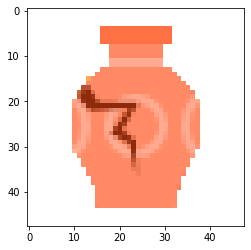

In [78]:
import glob
import cv2

DEFAULT_IMAGE_SIZE = 48

def load_images():
  images = []
  for filepath in sorted(glob.glob(f'/content/drive/MyDrive/cognitive/Data/{DEFAULT_IMAGE_SIZE}/*.png')):
    img = cv2.imread(filepath)
    images.append(img[:, :, ::-1])
  return images


gt_images = load_images()
plt.imshow(gt_images[1])

In [14]:
class SineLayer(nn.Module):
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class MultiImageSiren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

## Fitting the set of images


In [59]:
def get_mgrid_with_image_index(sidelen, image_idx):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = 2 * [torch.linspace(-1, 1, steps=sidelen)]
    mgrid = torch.stack(list(torch.meshgrid(*tensors)) + [torch.ones(sidelen, sidelen) * image_idx], dim=-1)
    mgrid = mgrid.reshape(-1, 3)
    return mgrid


def restore_model_image(model_output, sidelen):
  return 0.5 + np.clip(np.reshape(model_output, (sidelen, sidelen, 3)), -1, 1) / 2


def image_to_tensor(img, sidelength):
    img = Image.fromarray(img)        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img).permute(1, 2, 0)
    return img


class MultiImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        self.sidelength = sidelength
        self.images = [image_to_tensor(img, sidelength) for img in load_images()]
        # self.pixels = img.permute(1, 2, 0).view(-1, 1)
        # self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):  
        coords = get_mgrid_with_image_index(self.sidelength, idx)      
        return coords, self.images[idx].reshape(-1, 3)

In [41]:
images_ds = MultiImageFitting(DEFAULT_IMAGE_SIZE)
dataloader = DataLoader(images_ds, batch_size=1, pin_memory=True, num_workers=0)

multi_img_siren = MultiImageSiren(in_features=3, out_features=3, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
multi_img_siren.cuda()

MultiImageSiren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=3, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=3, bias=True)
  )
)

Epoch 0 (lr=5e-05)....................................................................................................Steps 100, Total loss 0.009228


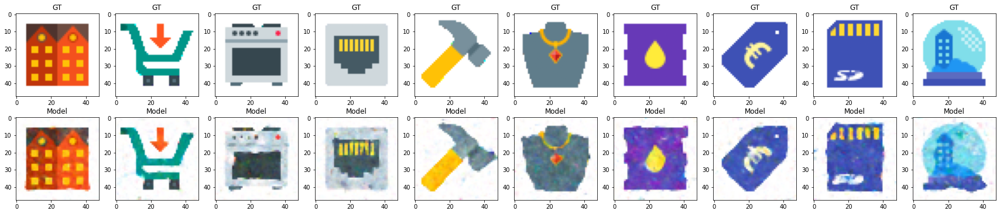

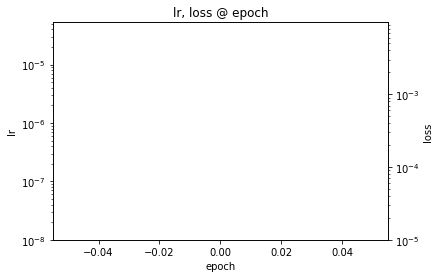

Epoch 1 (lr=5e-05)....................................................................................................Steps 200, Total loss 0.035317
Epoch 2 (lr=5e-05)....................................................................................................Steps 300, Total loss 0.025888
Epoch 3 (lr=5e-05)....................................................................................................Steps 400, Total loss 0.017463
Epoch 4 (lr=5e-05)....................................................................................................Steps 500, Total loss 0.018629
Epoch 5 (lr=5e-05)....................................................................................................Steps 600, Total loss 0.023908
Epoch 6 (lr=5e-05)....................................................................................................Steps 700, Total loss 0.026446
Epoch 7 (lr=5e-05)........................................................................................

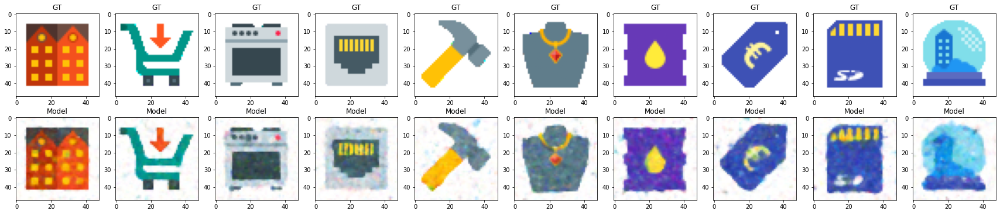

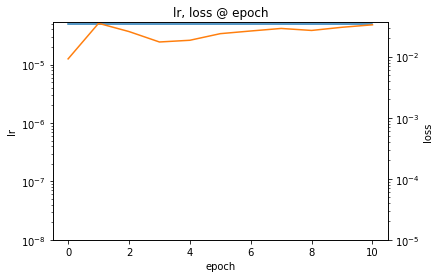

Epoch 11 (lr=5e-05)....................................................................................................Steps 1200, Total loss 0.027108
Epoch 12 (lr=5e-05)....................................................................................................Steps 1300, Total loss 0.027623
Epoch 13 (lr=5e-05)....................................................................................................Steps 1400, Total loss 0.025098
Epoch 14 (lr=5e-05)....................................................................................................Steps 1500, Total loss 0.024151
Epoch 15 (lr=5e-05)....................................................................................................Steps 1600, Total loss 0.024008
Epoch 16 (lr=5e-05)....................................................................................................Steps 1700, Total loss 0.021337
Epoch 17 (lr=5e-05)...........................................................................

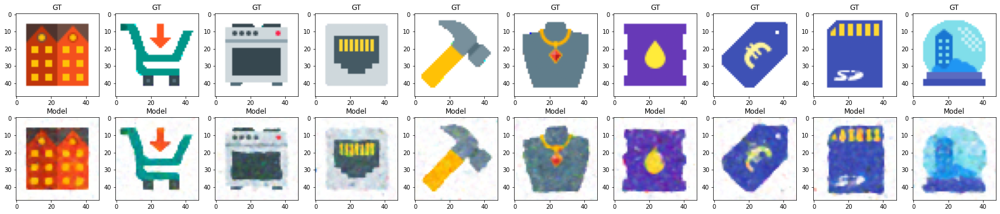

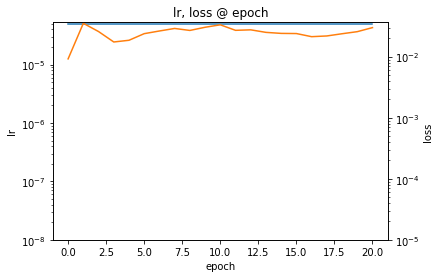

Epoch 21 (lr=5e-05)....................................................................................................Steps 2200, Total loss 0.038289
Epoch 22 (lr=5e-05)....................................................................................................Steps 2300, Total loss 0.032363
Epoch 23 (lr=5e-05)....................................................................................................Steps 2400, Total loss 0.026774
Epoch 24 (lr=5e-05)....................................................................................................Steps 2500, Total loss 0.033287
Epoch 25 (lr=5e-05)....................................................................................................Steps 2600, Total loss 0.037464
Epoch 26 (lr=5e-05)....................................................................................................Steps 2700, Total loss 0.046262
Epoch 27 (lr=5e-05)...........................................................................

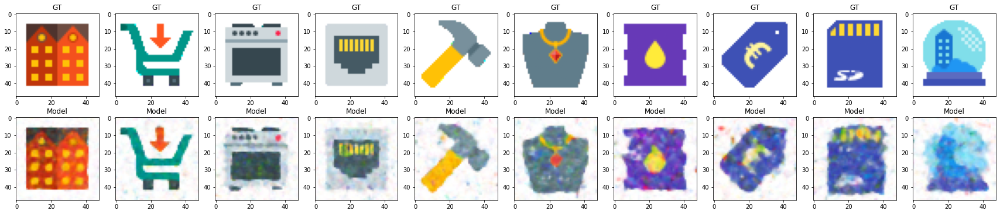

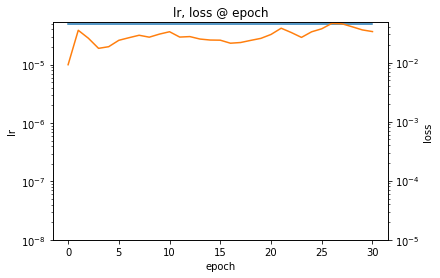

Epoch 31 (lr=5e-05)....................................................................................................Steps 3200, Total loss 0.032986
Epoch 32 (lr=5e-05)....................................................................................................Steps 3300, Total loss 0.032855
Epoch 33 (lr=5e-05)....................................................................................................Steps 3400, Total loss 0.038789
Epoch 34 (lr=5e-05)....................................................................................................Steps 3500, Total loss 0.036835
Epoch 35 (lr=5e-05)....................................................................................................Steps 3600, Total loss 0.033852
Epoch 36 (lr=5e-05)....................................................................................................Steps 3700, Total loss 0.038892
Epoch 37 (lr=5e-05)...........................................................................

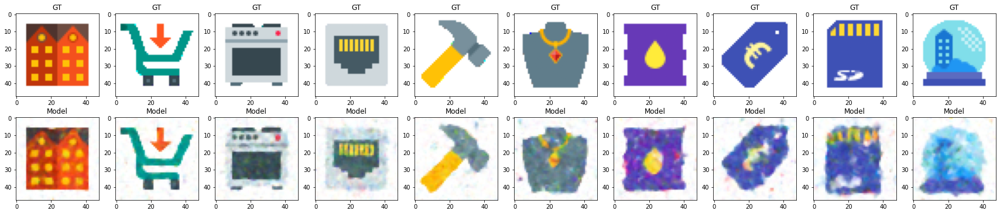

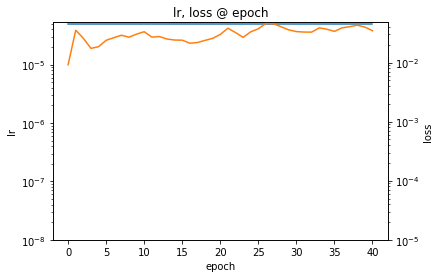

Epoch 41 (lr=5e-05)....................................................................................................Steps 4200, Total loss 0.034235
Epoch 42 (lr=5e-05)....................................................................................................Steps 4300, Total loss 0.036444
Epoch 43 (lr=5e-05)....................................................................................................Steps 4400, Total loss 0.035968
Epoch 44 (lr=5e-05)....................................................................................................Steps 4500, Total loss 0.031137
Epoch 45 (lr=5e-05)....................................................................................................Steps 4600, Total loss 0.028192
Epoch 46 (lr=5e-05)....................................................................................................Steps 4700, Total loss 0.027234
Epoch 47 (lr=5e-05)...........................................................................

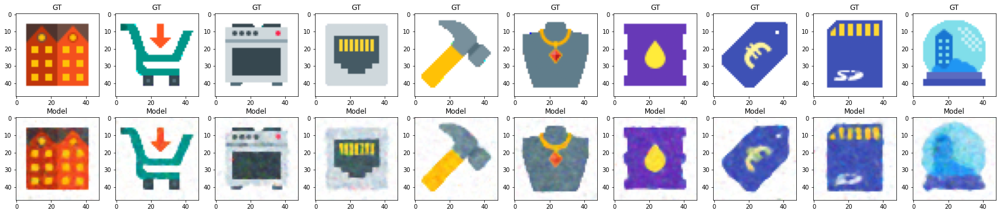

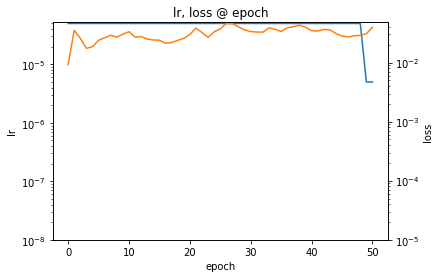

Epoch 51 (lr=5e-06)....................................................................................................Steps 5200, Total loss 0.020585
Epoch 52 (lr=5e-06)....................................................................................................Steps 5300, Total loss 0.015026
Epoch 53 (lr=5e-06)....................................................................................................Steps 5400, Total loss 0.012561
Epoch 54 (lr=5e-06)....................................................................................................Steps 5500, Total loss 0.010921
Epoch 55 (lr=5e-06)....................................................................................................Steps 5600, Total loss 0.009720
Epoch 56 (lr=5e-06)....................................................................................................Steps 5700, Total loss 0.008809
Epoch 57 (lr=5e-06)...........................................................................

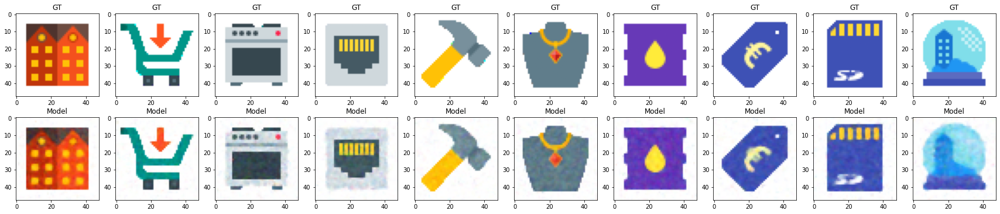

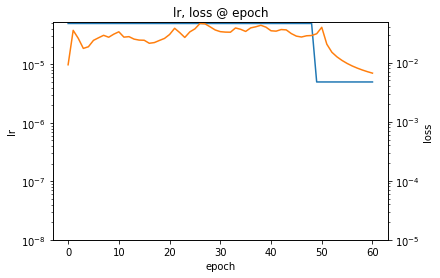

Epoch 61 (lr=5e-06)....................................................................................................Steps 6200, Total loss 0.006312
Epoch 62 (lr=5e-06)....................................................................................................Steps 6300, Total loss 0.006017
Epoch 63 (lr=5e-06)....................................................................................................Steps 6400, Total loss 0.005756
Epoch 64 (lr=5e-06)....................................................................................................Steps 6500, Total loss 0.005523
Epoch 65 (lr=5e-06)....................................................................................................Steps 6600, Total loss 0.005311
Epoch 66 (lr=5e-06)....................................................................................................Steps 6700, Total loss 0.005117
Epoch 67 (lr=5e-06)...........................................................................

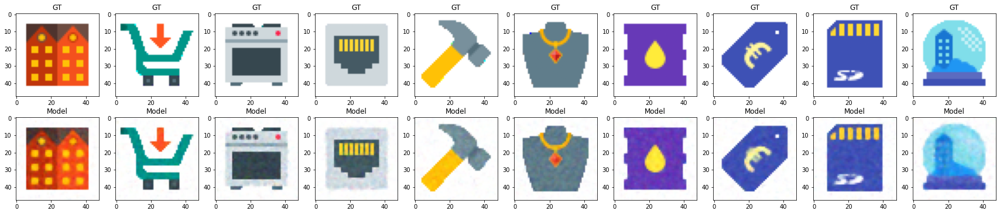

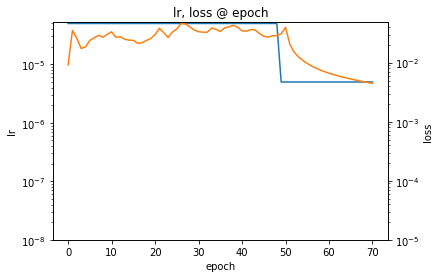

Epoch 71 (lr=5e-06)....................................................................................................Steps 7200, Total loss 0.004335
Epoch 72 (lr=5e-06)....................................................................................................Steps 7300, Total loss 0.004205
Epoch 73 (lr=5e-06)....................................................................................................Steps 7400, Total loss 0.004081
Epoch 74 (lr=5e-06)....................................................................................................Steps 7500, Total loss 0.003964
Epoch 75 (lr=5e-06)....................................................................................................Steps 7600, Total loss 0.003852
Epoch 76 (lr=5e-06)....................................................................................................Steps 7700, Total loss 0.003744
Epoch 77 (lr=5e-06)...........................................................................

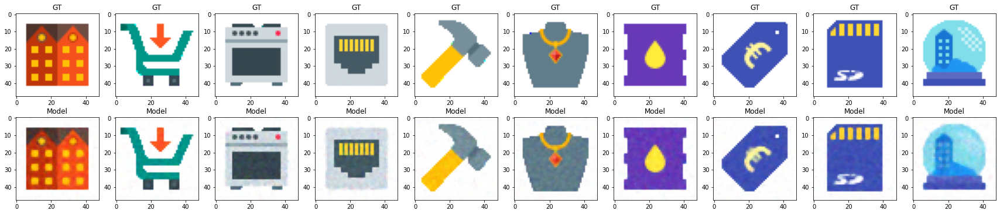

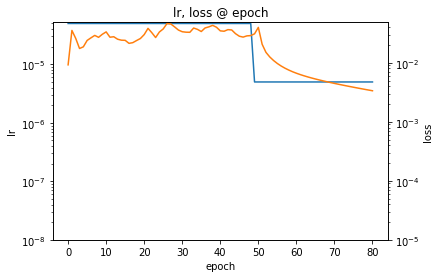

Epoch 81 (lr=5e-06)....................................................................................................Steps 8200, Total loss 0.003269
Epoch 82 (lr=5e-06)....................................................................................................Steps 8300, Total loss 0.003184
Epoch 83 (lr=5e-06)....................................................................................................Steps 8400, Total loss 0.003102
Epoch 84 (lr=5e-06)....................................................................................................Steps 8500, Total loss 0.003024
Epoch 85 (lr=5e-06)....................................................................................................Steps 8600, Total loss 0.002947
Epoch 86 (lr=5e-06)....................................................................................................Steps 8700, Total loss 0.002874
Epoch 87 (lr=5e-06)...........................................................................

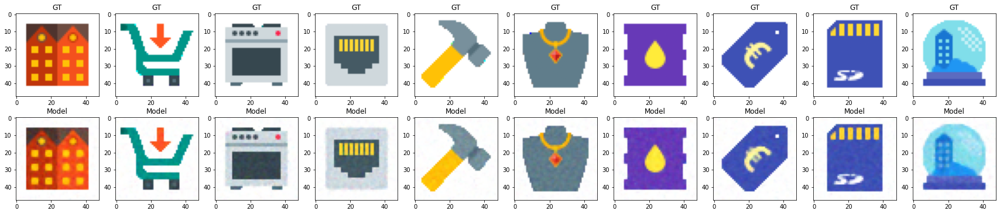

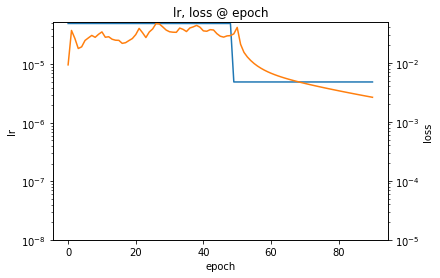

Epoch 91 (lr=5e-06)....................................................................................................Steps 9200, Total loss 0.002540
Epoch 92 (lr=5e-06)....................................................................................................Steps 9300, Total loss 0.002480
Epoch 93 (lr=5e-06)....................................................................................................Steps 9400, Total loss 0.002421
Epoch 94 (lr=5e-06)....................................................................................................Steps 9500, Total loss 0.002364
Epoch 95 (lr=5e-06)....................................................................................................Steps 9600, Total loss 0.002309
Epoch 96 (lr=5e-06)....................................................................................................Steps 9700, Total loss 0.002257
Epoch 97 (lr=5e-06)...........................................................................

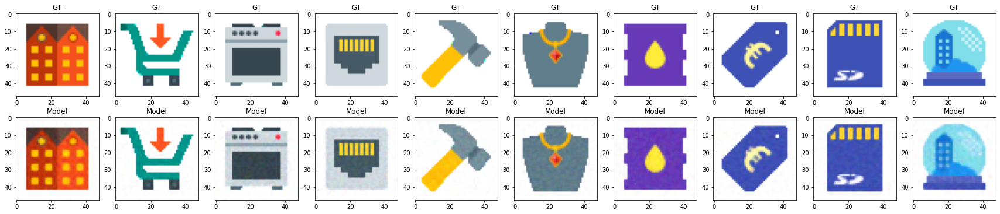

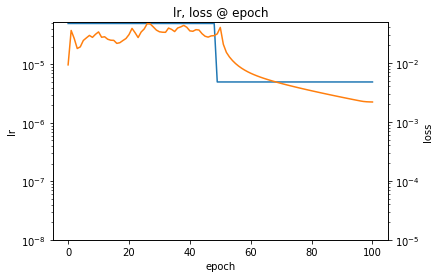

Epoch 101 (lr=5e-06)....................................................................................................Steps 10200, Total loss 0.002158
Epoch 102 (lr=5e-06)....................................................................................................Steps 10300, Total loss 0.002190
Epoch 103 (lr=5e-06)....................................................................................................Steps 10400, Total loss 0.002204
Epoch 104 (lr=5e-06)....................................................................................................Steps 10500, Total loss 0.002216
Epoch 105 (lr=5e-06)....................................................................................................Steps 10600, Total loss 0.002217
Epoch 106 (lr=5e-06)....................................................................................................Steps 10700, Total loss 0.002166
Epoch 107 (lr=5e-06)..............................................................

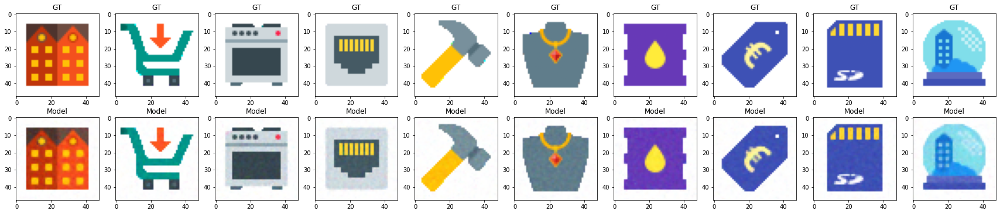

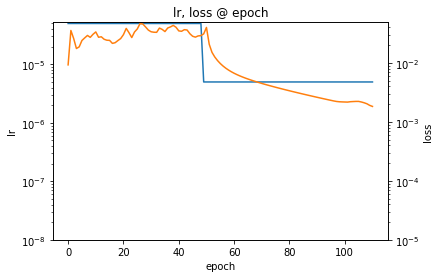

Epoch 111 (lr=5e-06)....................................................................................................Steps 11200, Total loss 0.001770
Epoch 112 (lr=5e-06)....................................................................................................Steps 11300, Total loss 0.001728
Epoch 113 (lr=5e-06)....................................................................................................Steps 11400, Total loss 0.001707
Epoch 114 (lr=5e-06)....................................................................................................Steps 11500, Total loss 0.001687
Epoch 115 (lr=5e-06)....................................................................................................Steps 11600, Total loss 0.001678
Epoch 116 (lr=5e-06)....................................................................................................Steps 11700, Total loss 0.001667
Epoch 117 (lr=5e-06)..............................................................

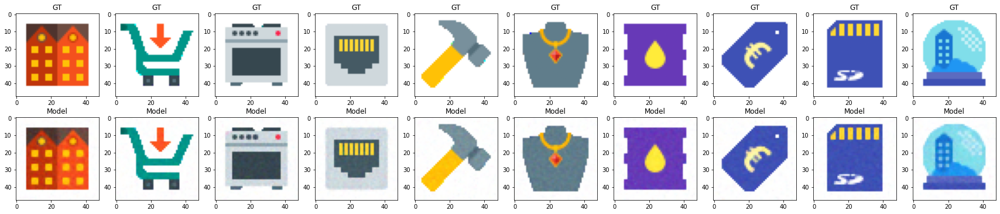

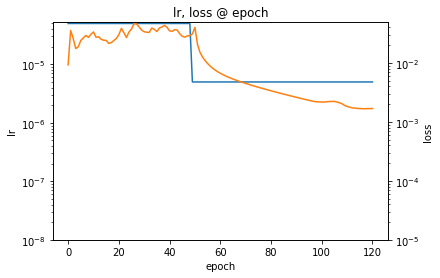

Epoch 121 (lr=5e-06)....................................................................................................Steps 12200, Total loss 0.001650
Epoch 122 (lr=5e-06)....................................................................................................Steps 12300, Total loss 0.001628
Epoch 123 (lr=5e-06)....................................................................................................Steps 12400, Total loss 0.001601
Epoch 124 (lr=5e-06)....................................................................................................Steps 12500, Total loss 0.001578
Epoch 125 (lr=5e-06)....................................................................................................Steps 12600, Total loss 0.001564
Epoch 126 (lr=5e-06)....................................................................................................Steps 12700, Total loss 0.001570
Epoch 127 (lr=5e-06)..............................................................

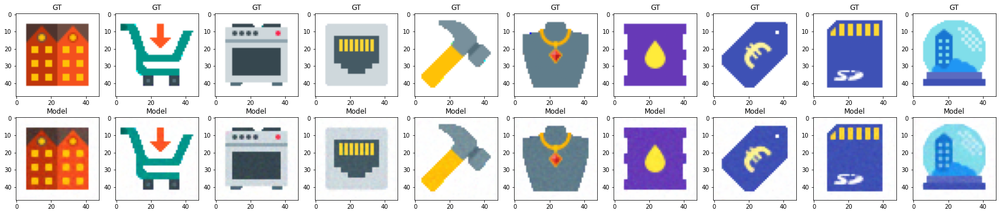

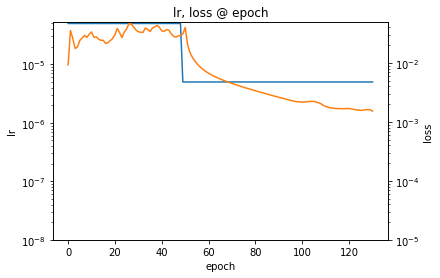

Epoch 131 (lr=5e-06)....................................................................................................Steps 13200, Total loss 0.001474
Epoch 132 (lr=5e-06)....................................................................................................Steps 13300, Total loss 0.001447
Epoch 133 (lr=5e-06)....................................................................................................Steps 13400, Total loss 0.001400
Epoch 134 (lr=5e-06)....................................................................................................Steps 13500, Total loss 0.001377
Epoch 135 (lr=5e-06)....................................................................................................Steps 13600, Total loss 0.001360
Epoch 136 (lr=5e-06)....................................................................................................Steps 13700, Total loss 0.001353
Epoch 137 (lr=5e-06)..............................................................

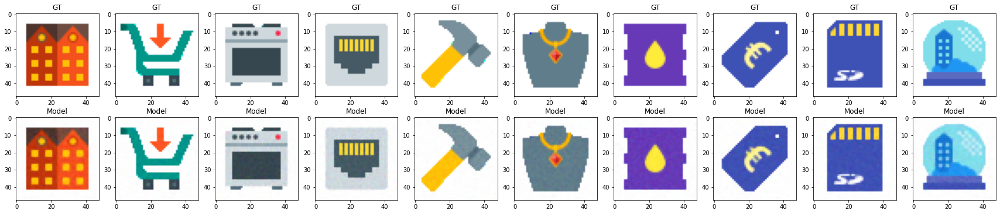

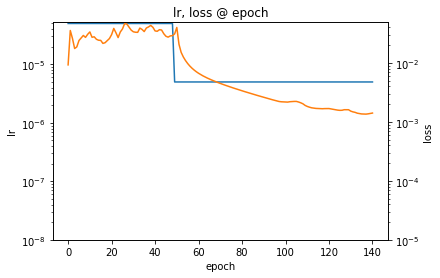

Epoch 141 (lr=5e-06)....................................................................................................Steps 14200, Total loss 0.001398
Epoch 142 (lr=5e-06)....................................................................................................Steps 14300, Total loss 0.001355
Epoch 143 (lr=5e-06)....................................................................................................Steps 14400, Total loss 0.001308
Epoch 144 (lr=5e-06)....................................................................................................Steps 14500, Total loss 0.001287
Epoch 145 (lr=5e-06)....................................................................................................Steps 14600, Total loss 0.001277
Epoch 146 (lr=5e-06)....................................................................................................Steps 14700, Total loss 0.001291
Epoch 147 (lr=5e-06)..............................................................

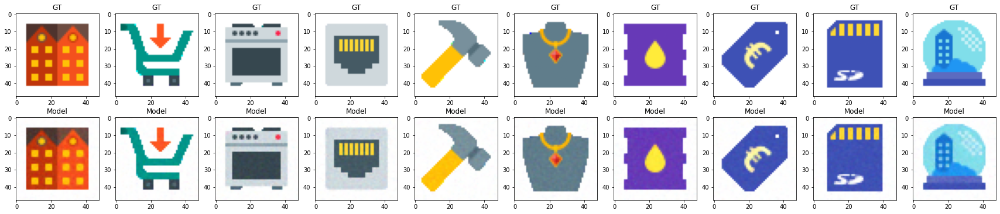

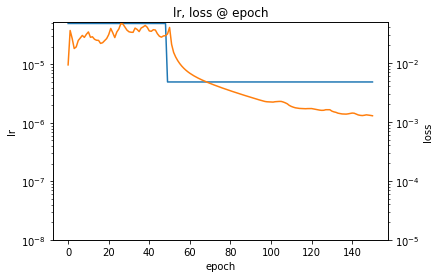

Epoch 151 (lr=5e-06)....................................................................................................Steps 15200, Total loss 0.001244
Epoch 152 (lr=5e-06)....................................................................................................Steps 15300, Total loss 0.001233
Epoch 153 (lr=5e-06)....................................................................................................Steps 15400, Total loss 0.001226
Epoch 154 (lr=5e-06)....................................................................................................Steps 15500, Total loss 0.001236
Epoch 155 (lr=5e-06)....................................................................................................Steps 15600, Total loss 0.001245
Epoch 156 (lr=5e-06)....................................................................................................Steps 15700, Total loss 0.001213
Epoch 157 (lr=5e-06)..............................................................

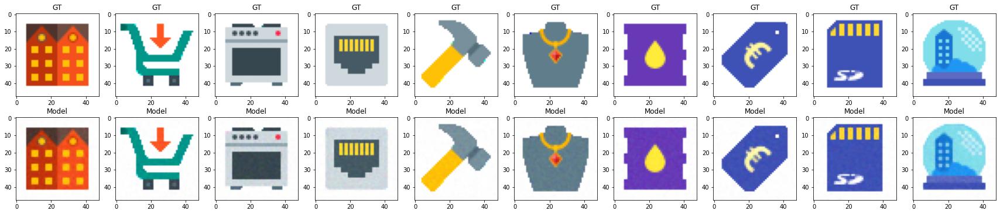

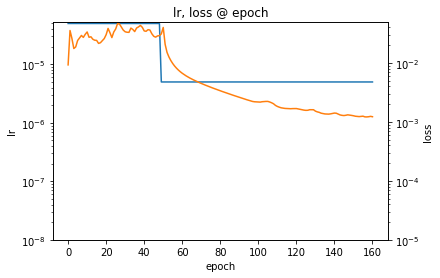

Epoch 161 (lr=5e-06)....................................................................................................Steps 16200, Total loss 0.001208
Epoch 162 (lr=5e-06)....................................................................................................Steps 16300, Total loss 0.001223
Epoch 163 (lr=5e-06)....................................................................................................Steps 16400, Total loss 0.001290
Epoch 164 (lr=5e-06)....................................................................................................Steps 16500, Total loss 0.001275
Epoch 165 (lr=5e-06)....................................................................................................Steps 16600, Total loss 0.001289
Epoch 166 (lr=5e-06)....................................................................................................Steps 16700, Total loss 0.001303
Epoch 167 (lr=5e-06)..............................................................

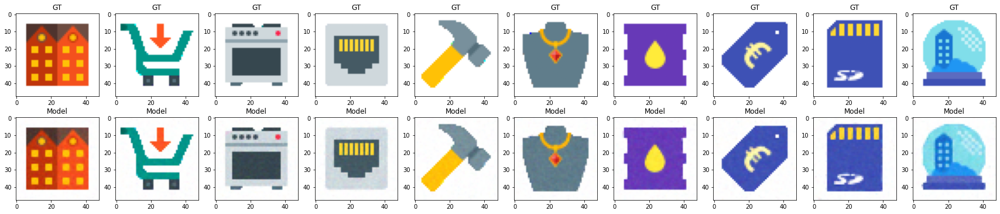

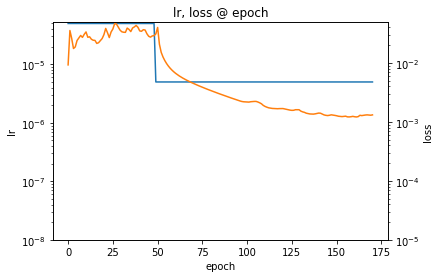

Epoch 171 (lr=5e-06)....................................................................................................Steps 17200, Total loss 0.001314
Epoch 172 (lr=5e-06)....................................................................................................Steps 17300, Total loss 0.001365
Epoch 173 (lr=5e-06)....................................................................................................Steps 17400, Total loss 0.001366
Epoch 174 (lr=5e-06)....................................................................................................Steps 17500, Total loss 0.001299
Epoch 175 (lr=5e-06)....................................................................................................Steps 17600, Total loss 0.001280
Epoch 176 (lr=5e-06)....................................................................................................Steps 17700, Total loss 0.001251
Epoch 177 (lr=5e-06)..............................................................

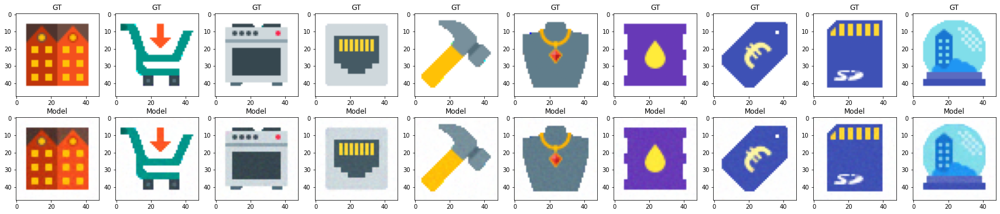

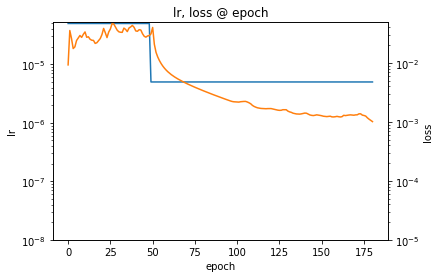

Epoch 181 (lr=5e-06)....................................................................................................Steps 18200, Total loss 0.000991
Epoch 182 (lr=5e-06)....................................................................................................Steps 18300, Total loss 0.000993
Epoch 183 (lr=5e-06)....................................................................................................Steps 18400, Total loss 0.001004
Epoch 184 (lr=5e-06)....................................................................................................Steps 18500, Total loss 0.001019
Epoch 185 (lr=5e-06)....................................................................................................Steps 18600, Total loss 0.001037
Epoch 186 (lr=5e-06)....................................................................................................Steps 18700, Total loss 0.001049
Epoch 187 (lr=5e-06)..............................................................

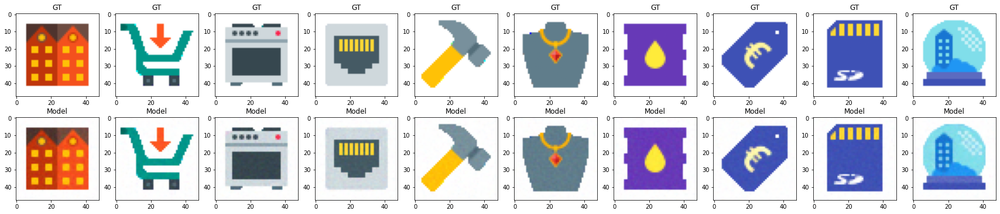

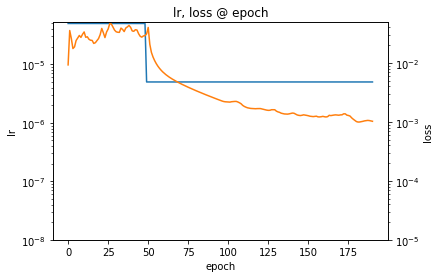

Epoch 191 (lr=5e-06)....................................................................................................Steps 19200, Total loss 0.001005
Epoch 192 (lr=5e-06)....................................................................................................Steps 19300, Total loss 0.000999
Epoch 193 (lr=5e-06)....................................................................................................Steps 19400, Total loss 0.000992
Epoch 194 (lr=5e-06)....................................................................................................Steps 19500, Total loss 0.000989
Epoch 195 (lr=5e-06)....................................................................................................Steps 19600, Total loss 0.000977
Epoch 196 (lr=5e-06)....................................................................................................Steps 19700, Total loss 0.000972
Epoch 197 (lr=5e-06)..............................................................

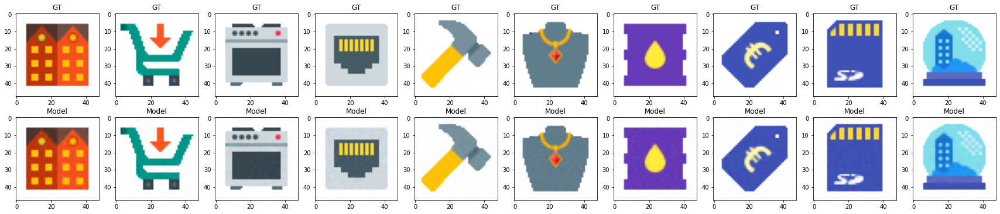

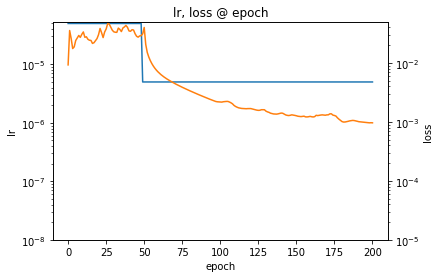

Epoch 201 (lr=5e-06)....................................................................................................Steps 20200, Total loss 0.000969
Epoch 202 (lr=5e-06)....................................................................................................Steps 20300, Total loss 0.000970
Epoch 203 (lr=5e-06)....................................................................................................Steps 20400, Total loss 0.000969
Epoch 204 (lr=5e-06)....................................................................................................Steps 20500, Total loss 0.000966
Epoch 205 (lr=5e-06)....................................................................................................Steps 20600, Total loss 0.000961
Epoch 206 (lr=5e-06)....................................................................................................Steps 20700, Total loss 0.000952
Epoch 207 (lr=5e-06)..............................................................

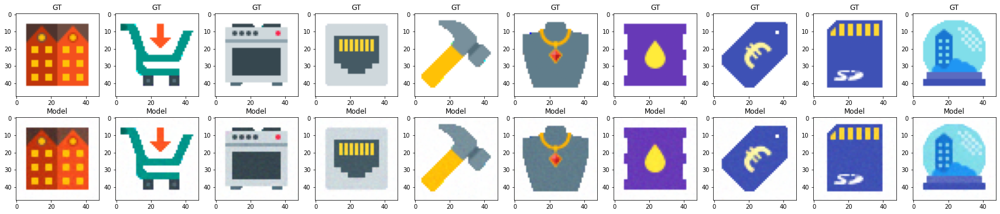

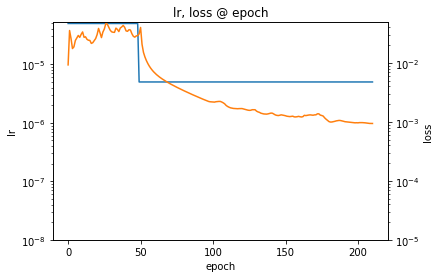

Epoch 211 (lr=5e-06)....................................................................................................Steps 21200, Total loss 0.000944
Epoch 212 (lr=5e-06)....................................................................................................Steps 21300, Total loss 0.000949
Epoch 213 (lr=5e-06)....................................................................................................Steps 21400, Total loss 0.000969
Epoch 214 (lr=5e-06)....................................................................................................Steps 21500, Total loss 0.001019
Epoch 215 (lr=5e-06)....................................................................................................Steps 21600, Total loss 0.001083
Epoch 216 (lr=5e-06)....................................................................................................Steps 21700, Total loss 0.001041
Epoch 217 (lr=5e-06)..............................................................

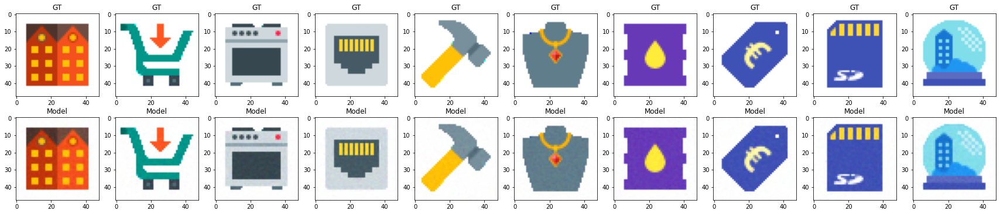

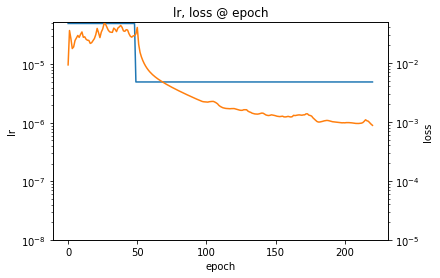

Epoch 221 (lr=5e-06)....................................................................................................Steps 22200, Total loss 0.000852
Epoch 222 (lr=5e-06)....................................................................................................Steps 22300, Total loss 0.000847
Epoch 223 (lr=5e-06)....................................................................................................Steps 22400, Total loss 0.000854
Epoch 224 (lr=5e-06)....................................................................................................Steps 22500, Total loss 0.000875
Epoch 225 (lr=5e-06)....................................................................................................Steps 22600, Total loss 0.000907
Epoch 226 (lr=5e-06)....................................................................................................Steps 22700, Total loss 0.000948
Epoch 227 (lr=5e-06)..............................................................

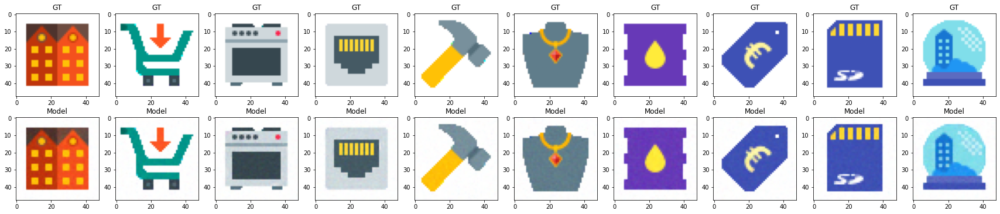

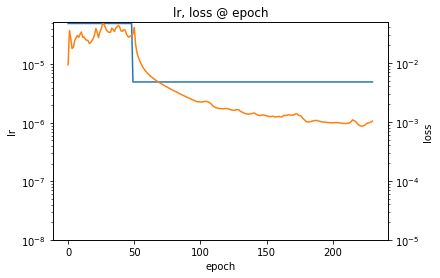

Epoch 231 (lr=5e-06)....................................................................................................Steps 23200, Total loss 0.001071
Epoch 232 (lr=5e-06)....................................................................................................Steps 23300, Total loss 0.001073
Epoch 233 (lr=5e-06)....................................................................................................Steps 23400, Total loss 0.001013
Epoch 234 (lr=5e-06)....................................................................................................Steps 23500, Total loss 0.000985
Epoch 235 (lr=5e-06)....................................................................................................Steps 23600, Total loss 0.000975
Epoch 236 (lr=5e-06)....................................................................................................Steps 23700, Total loss 0.000930
Epoch 237 (lr=5e-06)..............................................................

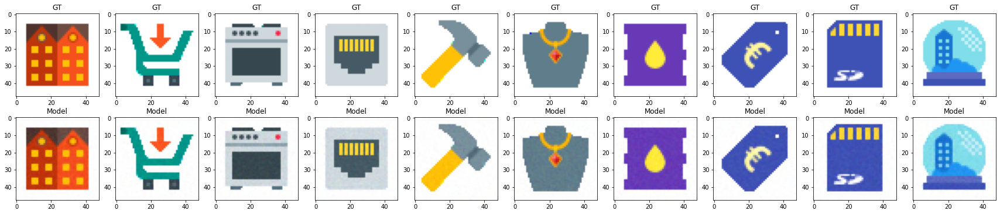

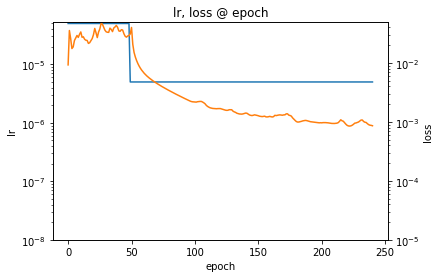

Epoch 241 (lr=5e-06)....................................................................................................Steps 24200, Total loss 0.000854
Epoch 242 (lr=5e-06)....................................................................................................Steps 24300, Total loss 0.000852
Epoch 243 (lr=5e-06)....................................................................................................Steps 24400, Total loss 0.000854
Epoch 244 (lr=5e-06)....................................................................................................Steps 24500, Total loss 0.000849
Epoch 245 (lr=5e-06)....................................................................................................Steps 24600, Total loss 0.000869
Epoch 246 (lr=5e-06)....................................................................................................Steps 24700, Total loss 0.000870
Epoch 247 (lr=5e-06)..............................................................

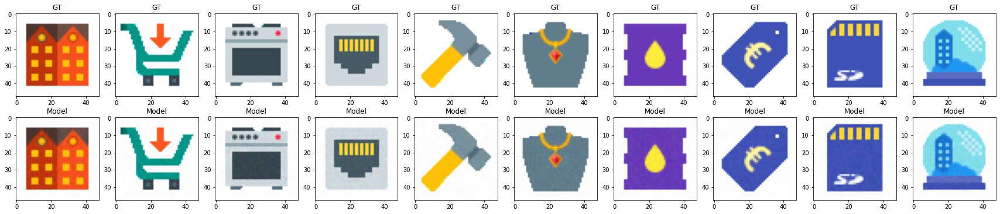

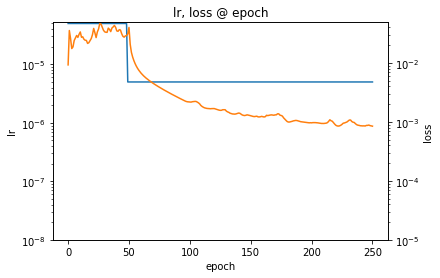

Epoch 251 (lr=5e-06)....................................................................................................Steps 25200, Total loss 0.000871
Epoch 252 (lr=5e-06)....................................................................................................Steps 25300, Total loss 0.000969
Epoch 253 (lr=5e-06)....................................................................................................Steps 25400, Total loss 0.001085
Epoch 254 (lr=5e-06)....................................................................................................Steps 25500, Total loss 0.001120
Epoch 255 (lr=5e-06)....................................................................................................Steps 25600, Total loss 0.000991
Epoch 256 (lr=5e-06)....................................................................................................Steps 25700, Total loss 0.000864
Epoch 257 (lr=5e-06)..............................................................

KeyboardInterrupt: ignored

In [60]:
TEST_IMAGE_INDICES = tuple(np.arange(0, len(gt_images), 10))
TOTAL_EPOCHS = 1000 
SUMMARY_INTERVAL_EPOCHS = 10

optim = torch.optim.Adam(lr=5e-5, params=multi_img_siren.parameters())
scheduler = torch.optim.lr_scheduler.MultiStepLR(optim, milestones=[50, 300], gamma=0.1)

epochs, losses, learning_rates = [], [], []
step = 0

for epoch in range(TOTAL_EPOCHS):
  print(f'Epoch {epoch} (lr={optim.param_groups[0]["lr"]})', end='')
  image_losses = []
  for model_input, ground_truth in dataloader:
    print('.', end='')
    step += 1
    model_input, ground_truth = model_input.cuda(), ground_truth.cuda()
    model_output, coords = multi_img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    image_losses.append(loss.cpu().detach())

    optim.zero_grad()
    loss.backward()
    optim.step()    
  scheduler.step()
  epochs.append(epoch)
  losses.append(np.mean(image_losses))
  learning_rates.append(optim.param_groups[0]["lr"])

  print("Steps %d, Total loss %0.6f" % (step, np.mean(image_losses)))
  if not epoch % SUMMARY_INTERVAL_EPOCHS:
    f, axs = plt.subplots(2, len(TEST_IMAGE_INDICES), figsize=(3 * len(TEST_IMAGE_INDICES), 6))
    for col, test_image_idx in enumerate(TEST_IMAGE_INDICES):
      model_input, ground_truth = images_ds[test_image_idx]
      model_output, _ = multi_img_siren(model_input.cuda())
      axs[0, col].imshow(restore_model_image(ground_truth.numpy(), DEFAULT_IMAGE_SIZE))
      axs[0, col].set_title('GT')
      axs[1, col].imshow(restore_model_image(model_output.cpu().detach().numpy(), DEFAULT_IMAGE_SIZE))
      axs[1, col].set_title('Model')
    plt.show()

    fig, ax1 = plt.subplots()
    ax1.plot(epochs, learning_rates,label='lr')
    ax1.set_title('lr, loss @ epoch')
    ax1.set_ylim(1e-8)
    ax1.set_ylabel('lr')
    ax1.set_xlabel('epoch')
    ax1.set_yscale("log")
    ax2 = ax1.twinx()
    ax2.plot(epochs, losses,'C1', label='loss')
    ax2.set_ylim(1e-5)
    ax2.set_ylabel('loss')
    ax2.set_yscale("log")
    plt.show()



##Upsample images

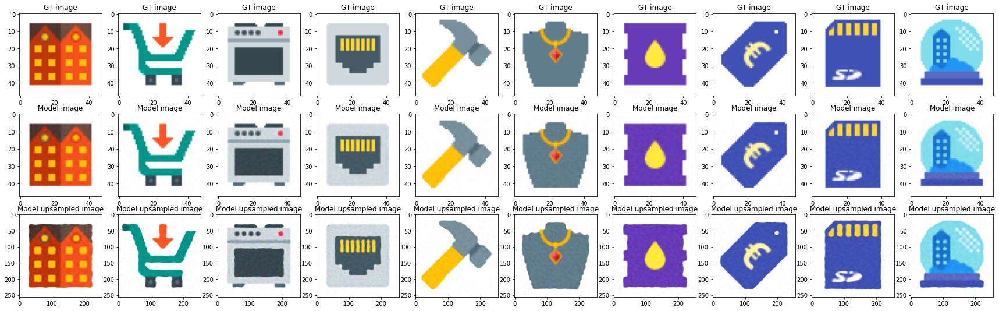

In [81]:
UPSAMPLE_SIZE = 256
normal_model_images = []
upsampled_model_images = []

for image_idx in range(len(gt_images)):
  normal_coords = get_mgrid_with_image_index(DEFAULT_IMAGE_SIZE, image_idx).cuda()
  model_output, _ = multi_img_siren(normal_coords.cuda())
  normal_model_images.append(restore_model_image(model_output.cpu().detach().numpy(), DEFAULT_IMAGE_SIZE))

  upsample_coords = get_mgrid_with_image_index(UPSAMPLE_SIZE, image_idx).cuda()
  model_output, _ = multi_img_siren(upsample_coords.cuda())
  upsampled_model_images.append(restore_model_image(model_output.cpu().detach().numpy(), UPSAMPLE_SIZE))


f, axs = plt.subplots(3, len(TEST_IMAGE_INDICES), figsize=(3 * len(TEST_IMAGE_INDICES), 9))
for col, test_image_idx in enumerate(TEST_IMAGE_INDICES):
  axs[0, col].imshow(gt_images[test_image_idx])
  axs[0, col].set_title('GT image')

  axs[1, col].imshow(normal_model_images[test_image_idx])
  axs[1, col].set_title('Model image')

  axs[2,  col].imshow(upsampled_model_images[test_image_idx])
  axs[2, col].set_title('Model upsampled image')
plt.show()

In [83]:
img1

array([[0.9947985 , 0.99831325, 0.9998217 , ..., 0.9986398 , 0.9981317 ,
        0.99777126],
       [0.9934177 , 0.99708545, 0.9996176 , ..., 0.9992754 , 0.99898535,
        0.9986441 ],
       [0.9932177 , 0.9966333 , 0.99936247, ..., 0.9997526 , 0.9997404 ,
        0.9996064 ],
       ...,
       [0.99103   , 0.9922756 , 0.9933259 , ..., 1.        , 1.        ,
        1.        ],
       [0.9904007 , 0.9901683 , 0.9900572 , ..., 1.        , 1.        ,
        1.        ],
       [0.993427  , 0.99207944, 0.99105793, ..., 0.9997844 , 1.        ,
        1.        ]], dtype=float32)

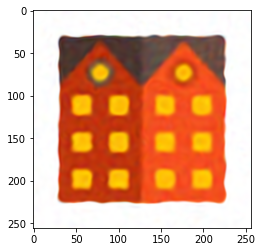

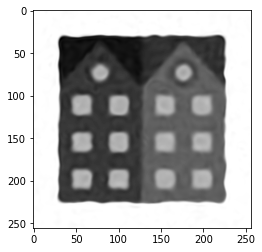

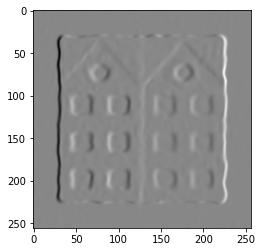

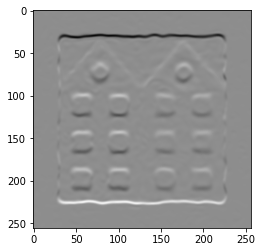

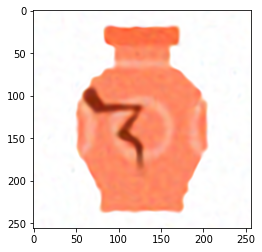

...

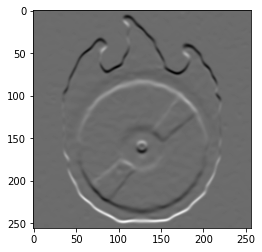

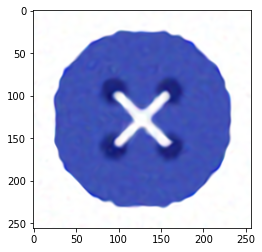

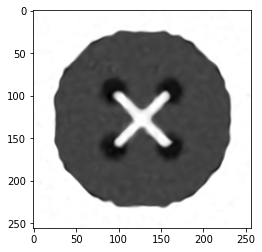

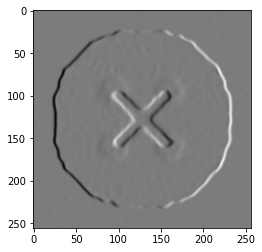

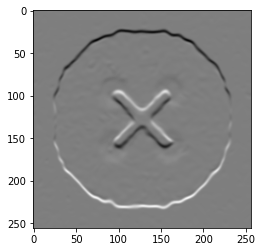

In [92]:
for i in range(10):
  img = upsampled_model_images[i]
  plt.imshow(img)
  plt.show()

  img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  plt.imshow(img, cmap='gray')
  plt.show()

  dx = cv2.Sobel(img,cv2.CV_32F,1,0,ksize=5)
  plt.imshow(dx, cmap='gray')
  plt.show()

  dy = cv2.Sobel(img,cv2.CV_32F,0,1,ksize=5)
  plt.imshow(dy, cmap='gray')
  plt.show() 
  

##Mix image pairs

In [141]:
def edge_compatibility_metric(img1, img2):
  img1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
  dx1 = cv2.Sobel(img1,cv2.CV_32F,1,0,ksize=5) 
  dy1 = cv2.Sobel(img1,cv2.CV_32F,0,1,ksize=5) 
  edges1 = (dx1 ** 2 + dy1 ** 2) ** 0.5

  img2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
  dx2 = cv2.Sobel(img2,cv2.CV_32F,1,0,ksize=5) 
  dy2 = cv2.Sobel(img2,cv2.CV_32F,0,1,ksize=5) 
  edges2 = (dx2 ** 2 + dy2 ** 2) ** 0.5

  return (np.abs(dx1 * dx2) + np.abs(dy1 * dy2)).sum() / (edges1 * edges2).sum()

def histogram_compatibility_metric(img1, img2):
  hist1 = cv2.calcHist([img1], [0, 1, 2], None, [8, 8, 8],
		[0, 1, 0, 1, 0, 1])
  hist2 = cv2.calcHist([img2], [0, 1, 2], None, [8, 8, 8],
		[0, 1, 0, 1, 0, 1])
  
  hist1 = cv2.normalize(hist1, hist1).flatten()
  hist2 = cv2.normalize(hist2, hist2).flatten()
  return 1 - cv2.compareHist(hist1, hist2, cv2.HISTCMP_BHATTACHARYYA)
  

N = len(upsampled_model_images)
pair_match_score = np.zeros((N , N))
for i in range(N):
  for j in range(i+1, N):
    img1, img2 = upsampled_model_images[i], upsampled_model_images[j]
    pair_match_score[i, j] = 0.8 * edge_compatibility_metric(
        img1, img2) + 0.2 * histogram_compatibility_metric(img1, img2)

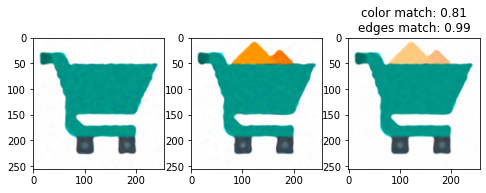

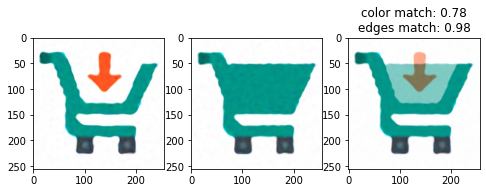

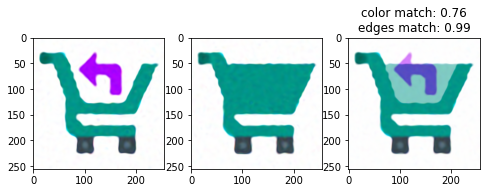

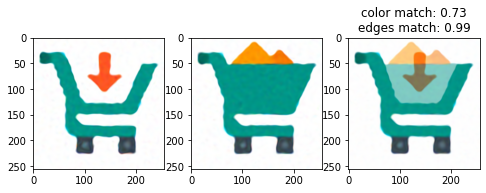

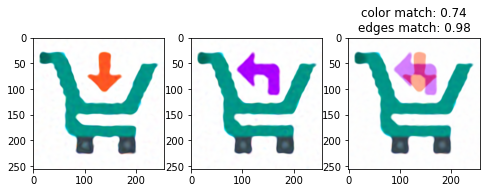

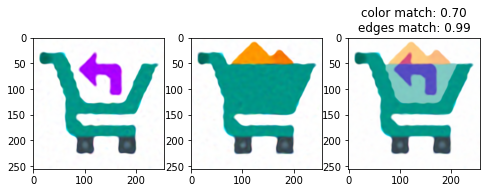

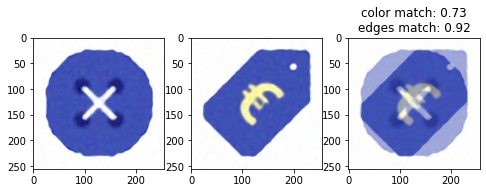

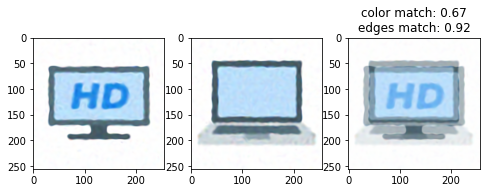

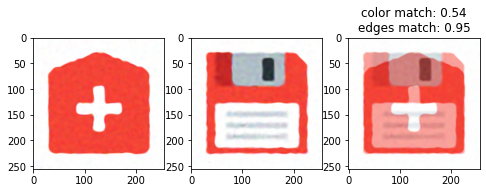

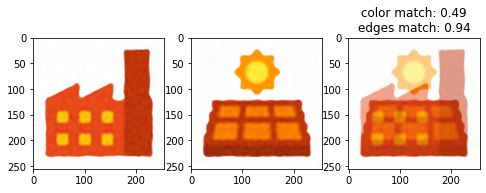

In [142]:
pair_inds = list(zip(*np.unravel_index(np.argsort(
    pair_match_score, axis=None), pair_match_score.shape)))[::-1][:10]
for i, j in pair_inds:
  img1, img2 = upsampled_model_images[i], upsampled_model_images[j]
  _, ax = plt.subplots(1, 3, figsize=(8, 4))
  ax[0].imshow(img1)
  ax[1].imshow(img2)
  ax[2].imshow((img1 + img2) / 2)
  ax[2].set_title(f'color match: {histogram_compatibility_metric(img1, img2):.2f}\n'
                  f'edges match: {edge_compatibility_metric(img1, img2):.2f}')
  plt.show()